In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot  as  plt
from sklearn.preprocessing import OneHotEncoder,MinMaxScaler,LabelEncoder
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

In [ ]:
flight_data = pd.read_csv("C:/Users/HP/Downloads/archive/Clean_Dataset.csv")
print(flight_data.head())
print('\n')
print(flight_data.info())
print('\n')
flight_data_copy1 = flight_data.copy()
flight_data_copy1.dropna(inplace=True)

   Unnamed: 0   airline   flight source_city departure_time stops  \
0           0  SpiceJet  SG-8709       Delhi        Evening  zero   
1           1  SpiceJet  SG-8157       Delhi  Early_Morning  zero   
2           2   AirAsia   I5-764       Delhi  Early_Morning  zero   
3           3   Vistara   UK-995       Delhi        Morning  zero   
4           4   Vistara   UK-963       Delhi        Morning  zero   

    arrival_time destination_city    class  duration  days_left  price  
0          Night           Mumbai  Economy      2.17          1   5953  
1        Morning           Mumbai  Economy      2.33          1   5953  
2  Early_Morning           Mumbai  Economy      2.17          1   5956  
3      Afternoon           Mumbai  Economy      2.25          1   5955  
4        Morning           Mumbai  Economy      2.33          1   5955  


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 12 columns):
 #   Column            Non-Null Co

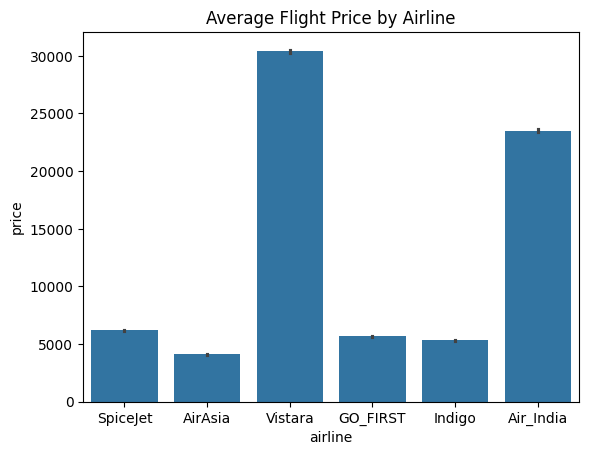

In [ ]:
sns.barplot(data=flight_data, x='airline', y='price')
plt.title("Average Flight Price by Airline")
plt.show()

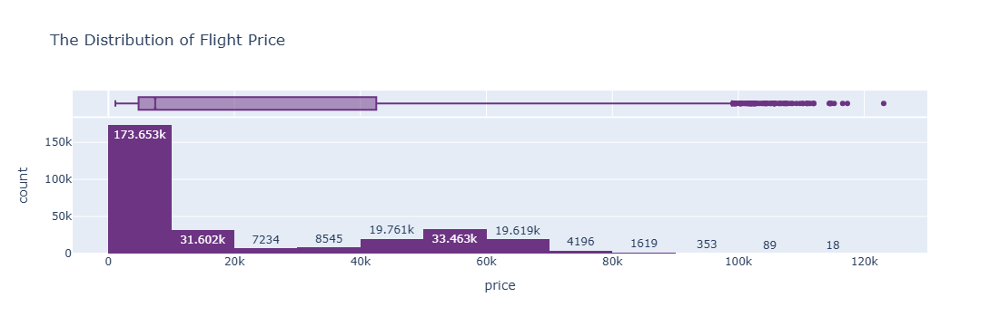

In [ ]:
import plotly.express as px
fig = px.histogram(data_frame=flight_data,
                   x ='price',
                   nbins=20,marginal='box',
                   color_discrete_sequence=['#6c3483'],
                   text_auto=True,title='The Distribution of Flight Price')
fig.update_layout()
fig.show()

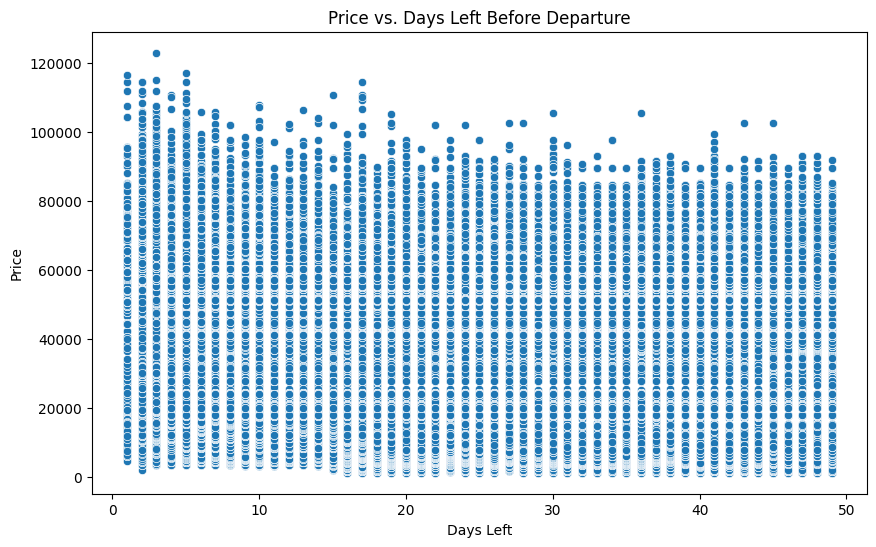

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='days_left', y='price', data=flight_data)
plt.title('Price vs. Days Left Before Departure')
plt.xlabel('Days Left')
plt.ylabel('Price')
plt.show()

In [ ]:
print("Unique values in departure_time before replacement:\n", flight_data_copy1['departure_time'].unique())
time_mapping = {
    'Early_Morning': '3:00', # Early Morning maps to 3:00 AM
    'Morning': '06:00',     # Morning maps to 6:00 AM
    'Afternoon': '12:00',   # Afternoon maps to 12:00 PM
    'Evening': '18:00',     # Evening maps to 6:00 PM
    'Night': '21:00',       # Night maps to 9:00 PM
    'Late_Night': '23:00'
}

if 'departure_time' in flight_data_copy1.columns:
    print("departure_time column found.")
    print("Non-null count in departure_time:", flight_data_copy1['departure_time'].notnull().sum())
    print("Sample values:\n", flight_data_copy1['departure_time'].head())
else:
    print("departure_time column not found in the dataset.")


flight_data_copy1['departure_time'] = flight_data_copy1['departure_time'].replace(time_mapping)
print("After replacement, sample departure_time values:\n", flight_data_copy1['departure_time'].head())

flight_data_copy1['departure_time'] = pd.to_datetime(flight_data_copy1['departure_time'], format='%H:%M', errors='coerce')
print("After conversion, sample departure_time values:\n", flight_data_copy1['departure_time'].head())

flight_data_copy1['departure_hour'] = flight_data_copy1['departure_time'].dt.hour
print("After extracting hour, sample departure_hour values:\n", flight_data_copy1['departure_hour'].head())

flight_data_copy1.dropna(subset=['departure_time'], inplace=True)

Unique values in departure_time before replacement:
 ['Evening' 'Early_Morning' 'Morning' 'Afternoon' 'Night' 'Late_Night']
departure_time column found.
Non-null count in departure_time: 300153
Sample values:
 0          Evening
1    Early_Morning
2    Early_Morning
3          Morning
4          Morning
Name: departure_time, dtype: object
After replacement, sample departure_time values:
 0    18:00
1     3:00
2     3:00
3    06:00
4    06:00
Name: departure_time, dtype: object
After conversion, sample departure_time values:
 0   1900-01-01 18:00:00
1   1900-01-01 03:00:00
2   1900-01-01 03:00:00
3   1900-01-01 06:00:00
4   1900-01-01 06:00:00
Name: departure_time, dtype: datetime64[ns]
After extracting hour, sample departure_hour values:
 0    18
1     3
2     3
3     6
4     6
Name: departure_hour, dtype: int32


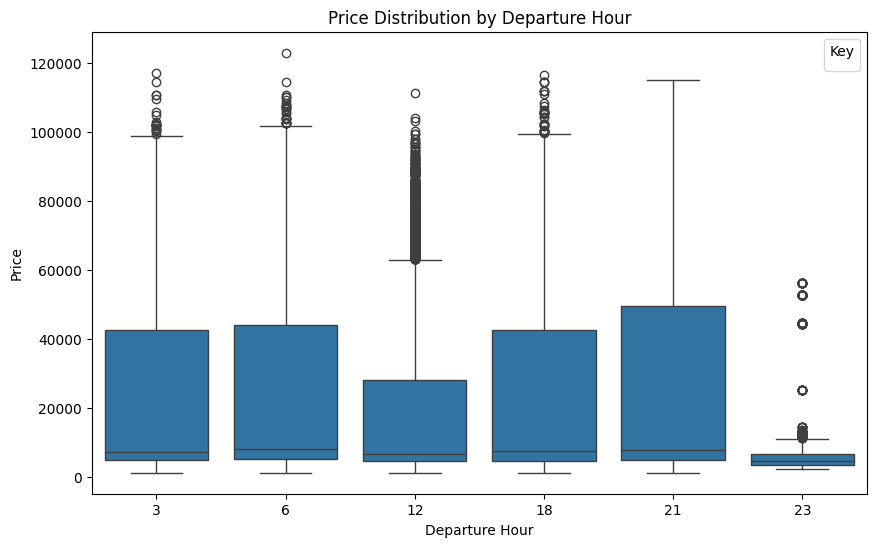

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='departure_hour', y='price', data=flight_data_copy1)
plt.title("Price Distribution by Departure Hour")
plt.xlabel("Departure Hour")
plt.ylabel("Price")
plt.show()

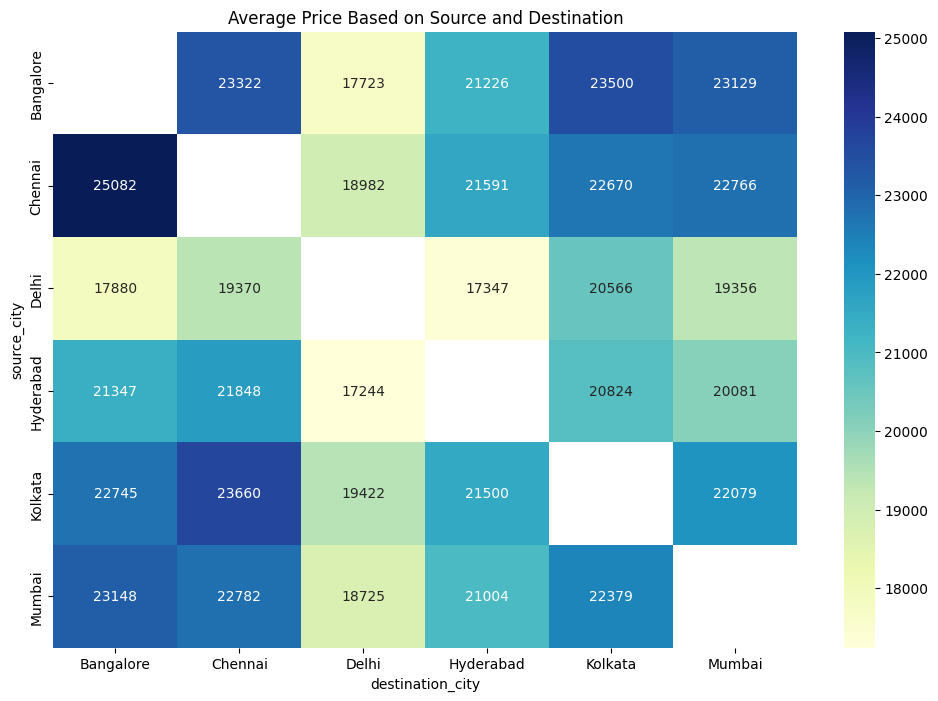

In [ ]:
route_price = flight_data.groupby(['source_city', 'destination_city'])['price'].mean().reset_index()
pivot_data = route_price.pivot(index='source_city', columns='destination_city', values='price')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_data, annot=True, cmap='YlGnBu', fmt='.0f')
plt.title('Average Price Based on Source and Destination')
plt.show()

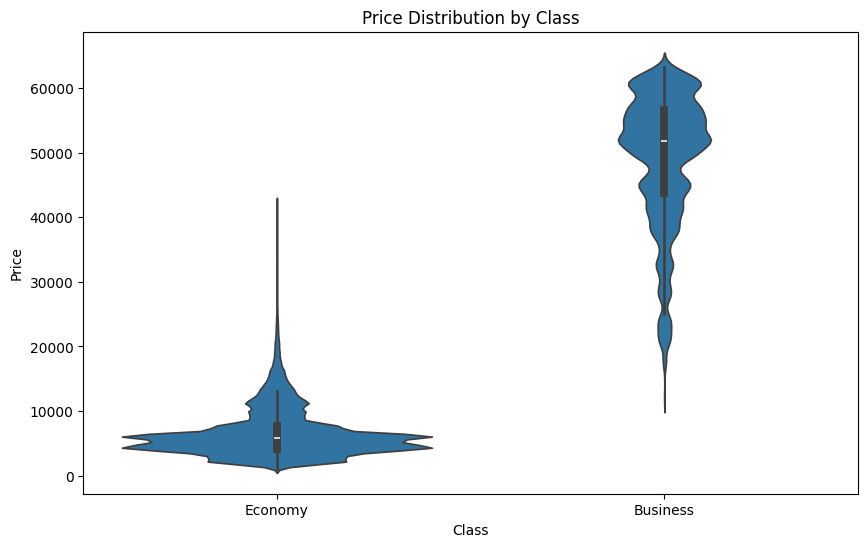

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='class', y='price', data=flight_data)
plt.title('Price Distribution by Class')
plt.xlabel('Class')
plt.ylabel('Price')
plt.show()

In [ ]:
print(flight_data.columns)

Index(['Unnamed: 0', 'airline', 'flight', 'source_city', 'departure_time',
       'stops', 'arrival_time', 'destination_city', 'class', 'duration',
       'days_left', 'price'],
      dtype='object')


In [ ]:
flight_data_copy = flight_data.copy()
flight_data_copy.dropna(inplace=True)

In [ ]:
flight_data_copy.dropna(inplace=True)
numeric_columns = ['duration', 'days_left']
scaler = MinMaxScaler()
flight_data_copy[numeric_columns] = scaler.fit_transform(flight_data_copy[numeric_columns])

In [ ]:
encoded_flight_data = pd.get_dummies(flight_data_copy, columns=['airline','flight','source_city','departure_time','stops','arrival_time','destination_city','class' ])

In [ ]:
print(encoded_flight_data.columns)

Index(['Unnamed: 0', 'duration', 'days_left', 'price', 'airline_AirAsia',
       'airline_Air_India', 'airline_GO_FIRST', 'airline_Indigo',
       'airline_SpiceJet', 'airline_Vistara',
       ...
       'arrival_time_Morning', 'arrival_time_Night',
       'destination_city_Bangalore', 'destination_city_Chennai',
       'destination_city_Delhi', 'destination_city_Hyderabad',
       'destination_city_Kolkata', 'destination_city_Mumbai', 'class_Business',
       'class_Economy'],
      dtype='object', length=1600)


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

X = encoded_flight_data.drop(columns=['price'])
y = encoded_flight_data['price']

xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state=42)

lr = LinearRegression()
lr.fit(xtrain, ytrain)

predictions = lr.predict(xtest)
lr_score = r2_score(ytest, predictions)

print("R-squared score:", lr_score)

R-squared score: 0.9262044549825454


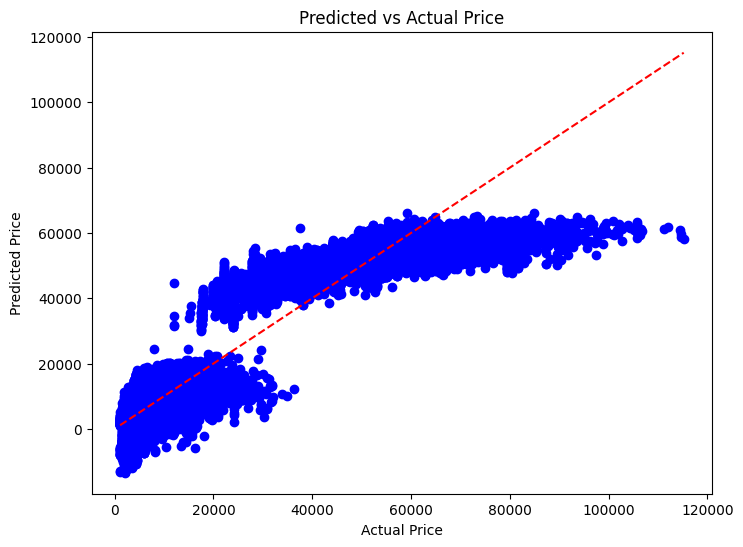

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(ytest, predictions, color='blue')
plt.plot([min(ytest), max(ytest)], [min(ytest), max(ytest)], color='red', linestyle='--')  # Perfect prediction line
plt.title('Predicted vs Actual Price')
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.show()